In [1]:
# All data sets for each notebook will be obtained with:
%run obtaining_and_Preparing_Datasets.ipynb

## Visualisation 1 
## Regarding the creation of linear and log graphs, the data set is passed into the appropiate function and the global sum of cases on each date is added to a list. This value is then plotted on the y-axis against the dates from the 22nd January to the current date on the x-axis. For the sake of efficiency, I only marked every three days on the x-axis.
## Regarding the graphs involving rolling averages, I got the sum on each date. However what I did then was I used my function 'get_daily_increase()' to get the daily increase of cases which was then passed as the values to a new dataframe. The pandas function '.rolling(window=3).mean()' was then applied to this dataframe to obtain the three day rolling average. It was then plotted as a bar graph and I plotted the daily increase values as a line graph to see the differences between them.

In [5]:
# This function is used in the y labels in the graphs to quantify 
# the amount in which they increase. This was the most "algorithmic" way I could figure
# out to achieve what I wanted without hard coding each graph individually.
def get_number_len(num):
    if len(str(num)) > 6:
        return 'Per Million'
    elif len(str(num)) >= 5:
        return 'Per Hundred Thousand'
    else:
        return 'Per Thousand'

In [6]:
def get_daily_increase(vals):
    newVals = []
    newVals.append(0)
    for i in range(1, len(vals)):
        newVals.append(vals[i] - vals[i - 1])
        
    return newVals

In [7]:
def make_linear_log_graphs(df, df_name, option):
    fig = plt.figure(figsize=(150,75))
    ax = fig.add_subplot(111)
    
    
    plt.grid(b=True, which='major', color='#999999', linewidth=2, linestyle='-')
    plt.minorticks_on()
    plt.grid(b=True, which='minor', color='#999999', linestyle='-', linewidth=3, alpha=0.2)
    
    x = list(df.columns[3:]) # Obtaining my dates
    y = []
    # The following for loop obtains the sum of each column to be used for the plot.
    for i in df.columns[3:]:
        y.append(sum(df[i]))
    
    # Arranges the xticks such that every third tick is placed rather than all of them.
    plt.xticks(np.arange(0, len(x), 3), fontsize = 100, rotation = 45)
    plt.yticks(fontsize = 100)
    
    # Removes scientific notation that would be placed upon the y-axis.
    plt.ticklabel_format(style='plain', axis='y')
    ax.yaxis.set_major_formatter(mticker.ScalarFormatter())
    ax.yaxis.get_major_formatter().set_scientific(False)
    ax.yaxis.get_major_formatter().set_useOffset(False)
    fig.tight_layout()

    plt.xlabel('\n' + df_name, fontsize = 110, weight='bold')
    plt.ylabel('Total Coronavirus ' + df_name + '\n(' + get_number_len(df[df.columns[-1]]) + ')\n', fontsize=100, weight='bold')
    plt.title('Total ' + df_name + '\n(Linear Scale)\n', fontsize = 110, weight='bold')
    
    if option == 'linear':
        plt.yscale('linear')
        plt.ticklabel_format(style='plain', axis='y')
        plt.title('Total ' + df_name + '\n(Linear Scale)\n', fontsize = 110, weight='bold')
        plt.plot(x, y, linewidth = 20)
       # plt.savefig('Linear_Graphs_' + df_name)
        plt.show()
    else:
        plt.yscale('log')
        plt.title('Total ' + df_name + '\n(Log Scale)\n', fontsize = 110, weight='bold')
        # The following needs to be redeclared to remove scientific notation for the y-axis.
        ax.yaxis.set_major_formatter(mticker.ScalarFormatter())
        ax.yaxis.get_major_formatter().set_scientific(False)
        ax.yaxis.get_major_formatter().set_useOffset(False)
        fig.tight_layout()
        plt.plot(x, y, linewidth = 20)
       # plt.savefig('Log_Graphs_' + df_name)
        plt.show()

In [8]:
def make_rolling_graphs(df, df_name):
    
    plt.figure(figsize = (150, 75))
        
    x = list(df.columns[3:])  # Obtaining my dates
    
    # Getting the sums like before.
    sums = []
    for i in df.columns[3:]:
        sums.append(sum(df[i]))
        
    
    plt.grid(b=True, which='major', color='#999999', linewidth=2, linestyle='-')
    plt.minorticks_on()
    plt.grid(b=True, which='minor', color='#999999', linestyle='-', linewidth=3, alpha=0.2) 
    
    y_bar = get_daily_increase(sums) # Getting the daily increase
    # Using the daily increase and rolling average ina 
    y = pd.DataFrame(y_bar)
    y = y.rolling(window=3).mean()

    plt.xlabel('\n' + df_name, fontsize = 110, weight='bold')
    plt.ylabel('Novel Coronavirus Daily ' + df_name + '\n(' + get_number_len(y_bar[len(y_bar) - 1]) + ')\n', fontsize=110, weight='bold')
    plt.title('Daily New ' + df_name + '\nCases per Day\nData as of 0:00 GMT+0\n', fontsize = 110, weight='bold') 
    
    plt.xticks(np.arange(0, len(x), 3), fontsize=80, rotation = 45)
    plt.yticks(fontsize=80)
    plt.ticklabel_format(style='plain', axis='y')
    plt.yscale('linear')
    
    plt.bar(x, y_bar, color = 'grey', label='Daily Increase')
    plt.plot(x, y, color = 'red', linewidth=20, label='3 Day Rolling Average')
    plt.legend(loc="upper left", prop={'size': 100})
    plt.savefig('Rolling_Graphs_' + df_name)
    plt.show()

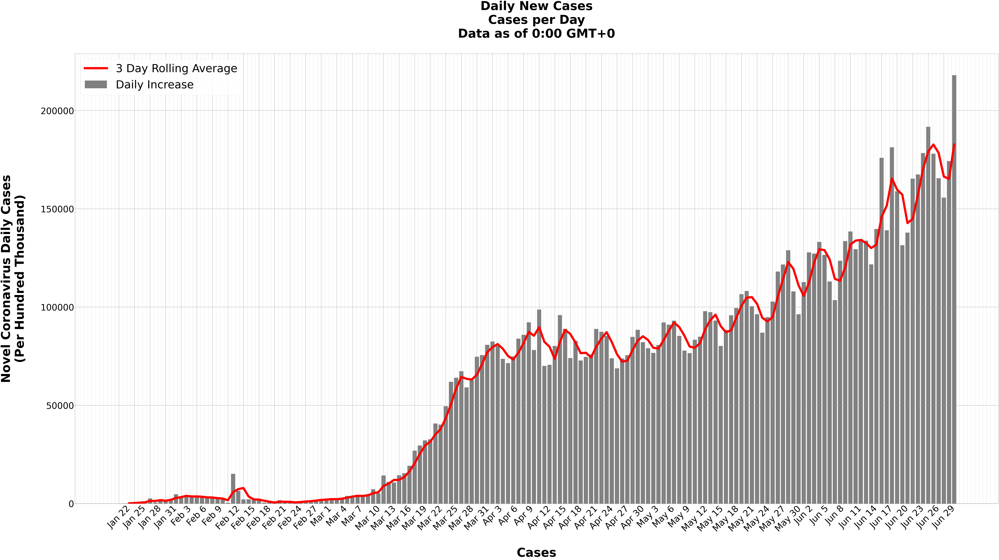

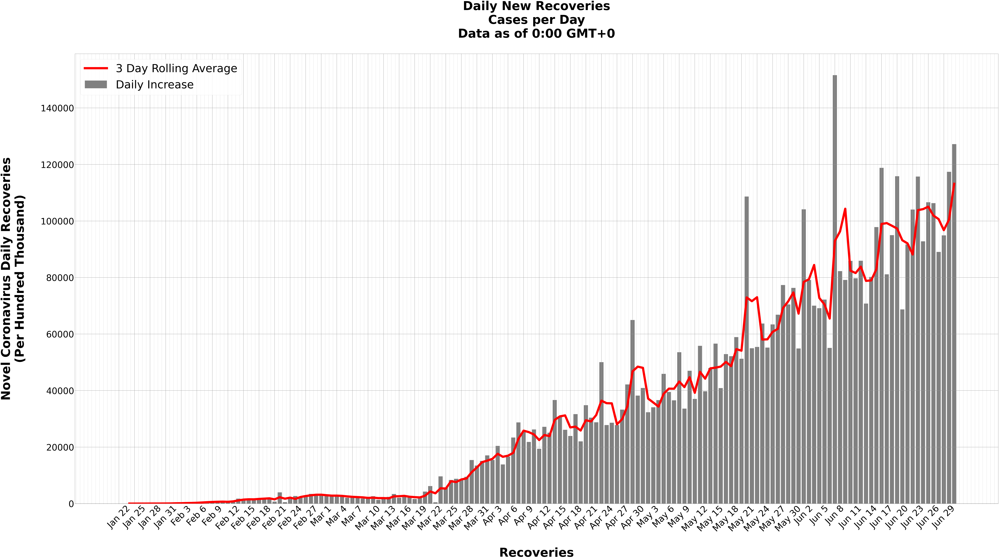

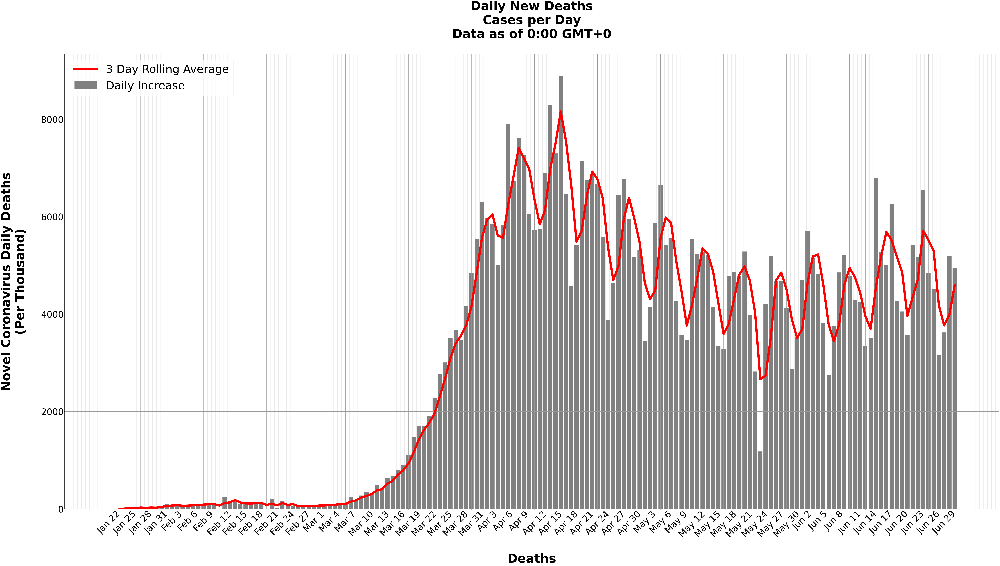

In [9]:
make_rolling_graphs(cases, 'Cases')
make_rolling_graphs(recovered, 'Recoveries')
make_rolling_graphs(deaths, 'Deaths')

make_linear_log_graphs(cases, 'Cases', 'linear')
make_linear_log_graphs(recovered, 'Recoveries', 'linear')
make_linear_log_graphs(deaths, 'Deaths', 'linear')

make_linear_log_graphs(cases, 'Cases', 'log')
make_linear_log_graphs(recovered, 'Recoveries', 'log')
make_linear_log_graphs(deaths, 'Deaths', 'log')